# Aprendizaje Automático - Trabajo Práctico
## Profesores
* Joel Spak
* Augstín Almada
* Bruno Cocitto López
## Alumnos
* Ezequiel Arévalo
* Simón Revello

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sbn
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
import warnings

In [36]:
warnings.simplefilter(action='ignore', category=FutureWarning)

In [37]:
DATA_FILE = "weatherAUS.csv"
data = pd.read_csv(DATA_FILE)

## Análisis Descriptivo

Nos quedamos con las localidades que corresponden para el trabajo práctico e imprimimos los campos del dataset para entenderlo mejor.

In [38]:
data.query("Location in ('Sydney', 'SydneyAirport', 'Canberra', 'Melbourne', 'MelbourneAirport')", inplace=True)
data.drop("Unnamed: 0", axis=1, inplace=True)

In [39]:
print(data.info())
print("-----------------------------------")
print(data.describe())
print("-----------------------------------")
print(data.head())

<class 'pandas.core.frame.DataFrame'>
Index: 15986 entries, 30167 to 70370
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Date              15986 non-null  object 
 1   Location          15986 non-null  object 
 2   MinTemp           15495 non-null  float64
 3   MaxTemp           15500 non-null  float64
 4   Rainfall          15199 non-null  float64
 5   Evaporation       14280 non-null  float64
 6   Sunshine          14038 non-null  float64
 7   WindGustDir       14529 non-null  object 
 8   WindGustSpeed     14531 non-null  float64
 9   WindDir9am        15291 non-null  object 
 10  WindDir3pm        15696 non-null  object 
 11  WindSpeed9am      15725 non-null  float64
 12  WindSpeed3pm      15737 non-null  float64
 13  Humidity9am       15416 non-null  float64
 14  Humidity3pm       15461 non-null  float64
 15  Pressure9am       15251 non-null  float64
 16  Pressure3pm       15260 non-null  float64

## Valores Nulos
Graficamos la dispersion de los valores nulos en un mapa de calor

<Axes: >

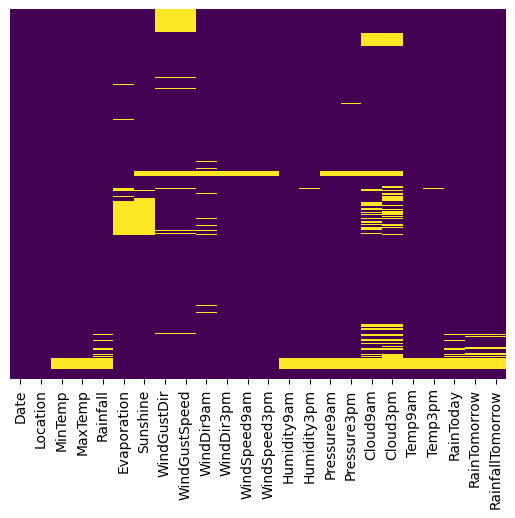

In [40]:
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False)

# Tratamiento de los valores nulos
---
## RainTomorrow, RainToday y RainfallTomorrow

<p> Removeremos las filas que contengan valores nulos para RainToday, RainTomorrow y RainfallTomorrow y la almacenaremos en una variable para utilizarla para predecir sus valores como practica un vez que se tenga el modelo armado con la regresion lineal. </p>

In [41]:
null_rows_for_predictions = data.loc[ data['RainTomorrow'].isnull() | data['RainfallTomorrow'].isnull() | data['Rainfall'].isnull()  ]
data = data [ data['RainTomorrow'].notna() & data["RainfallTomorrow"].notna() & data["RainToday"].notna() ]

## Generar encodings para variable categoricas no numericas
### Encoding de la variable Date
<p> Se intentaron realizar 3 versiones de encoding para la variable date, por semanas, por meses y por estacion </p>
<p> Luego de probar concluimos que el modelo arrojaba valores muy simalares para las 3 formas de codificar la fecha.</p>
<p> Euristicamente concluimos que no hay un impacto significativo en elegir una de las 3 pero se elige la agrupacion por estacion porque al ser solo 4 variables ayuda a explicar el modelo.</p>
<p> Se deja comentado el codigo del encoding para semanas y meses, pero no se utiliza para un mejor entendimiento de los graficos </p>


In [42]:
from datetime import datetime

#data["Week"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').date().isocalendar().week )
#data["Month"] = data["Date"].apply(lambda time: datetime.strptime(time, '%Y-%m-%d').month)
data["Season"] = data["Date"].apply(lambda time: ( datetime.strptime(time, '%Y-%m-%d').month ) %12 // 3 + 1 )

data.drop("Date", axis=1, inplace=True)

### Generar enconding para el resto de las variables

Para variables Yes/No como RainToday and RainTomorrow generamos encoding binarios asignando 1 y 0 respectivamente.
<p> Para variables que describen las direcciones del viento, las colapsamos en 4 valores N,S,W y E. Luego la transformamos a variables dummies al igual que Location. </p>

In [43]:
from sklearn.preprocessing import LabelEncoder

one_hot_encoding=pd.get_dummies(data.Location, dtype=int)
data.drop("Location", axis=1, inplace=True)
data = data.join(one_hot_encoding)

cardinal_points_map = {
    "N" : "^N.*$",
    "S" : "^S.*$",
    "W" : "^W.*$",
    "E" : "^E.*$"
}

for k,v in cardinal_points_map.items():
    data.WindGustDir.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir3pm.replace( to_replace=v, value=k, regex=True, inplace=True)
    data.WindDir9am.replace( to_replace=v, value=k, regex=True, inplace=True)

one_hot_encoding=pd.get_dummies(data.WindGustDir, dtype=int, prefix="WindGustDir_")
data.drop("WindGustDir", axis=1, inplace=True)
data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir9am, dtype=int,  prefix="WindDir9am_")
data.drop("WindDir9am", axis=1, inplace=True)
data = data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.WindDir3pm, dtype=int,  prefix="WindDir3pm_")
data.drop("WindDir3pm", axis=1, inplace=True)
data = data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Month, dtype=int, prefix="Month_")
# data.drop("Month", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

one_hot_encoding=pd.get_dummies(data.Season, dtype=int, prefix="Season_")
data.drop("Season", axis=1, inplace=True)
data= data.join(one_hot_encoding)

# one_hot_encoding=pd.get_dummies(data.Week, dtype=int, prefix="Week_")
# data.drop("Week", axis=1, inplace=True)
# data= data.join(one_hot_encoding)

le = LabelEncoder()
data["RainToday"] = le.fit_transform(data.RainToday)
data["RainTomorrow"] = le.fit_transform(data.RainTomorrow)

full_data_encoded = data.copy() # esta variable se utilizara mas adelante para calcular una regresion sobre los datos sin interpolar

## Graficar y entendier la distribucion de las variables

Primero, trataremos de entender la distribucion del resto de las variables y cómo se ajustan los distintos métodos de interpolación a los datos.

### Interpolar utilizando method='linear'

Considerando que los datos están organizados de manera cronológica y representan valores recolectados cronologicamente para fechas consecutivas, estas no deberian variar demasiado, asi que aplicamos la función de interpolación utilizando el parámetro 'linear' para completar los valores faltantes con datos similares.

A continuación, se muestran como se reemplazan los valores nulos en el conjunto de datos, demostrando que la interpolación 'linear' es más efectiva que, por ejemplo, el uso del 'promedio' para rellenar valores nulos en todas las variables a excepción de Cloud9am, Cloud3pm, Evaporation y Sunshine.

In [44]:
def plot_interpolated_scatter(cols: list, pd_data: pd.DataFrame, method: str, order:any = None, sx :int = None, sy:int = None, fsize : tuple=(12,12)):

    sx = int(len(cols)/2) + int(len(cols)%2) if not sx else sx 
    sy = 2 if not sy else sy 

    f, axs = plt.subplots(sx,sy, figsize=fsize, squeeze=False)
    
    i = 0
    for x in range(0, sx):
        for y in range(0,sy):
            if i > len(cols)-1:
                break
            col = cols[i]
            data_to_plot = pd_data[[col]].copy()
            data_to_plot.loc[:, "is_nan"] = data_to_plot[col].isnull()
            data_to_plot.interpolate(method=method,order=order, inplace=True)
            sbn.scatterplot(data=data_to_plot, x=range(0, data_to_plot.shape[0] ), y=col, hue="is_nan", ax=axs[x][y])
            i+=1
    plt.show()    

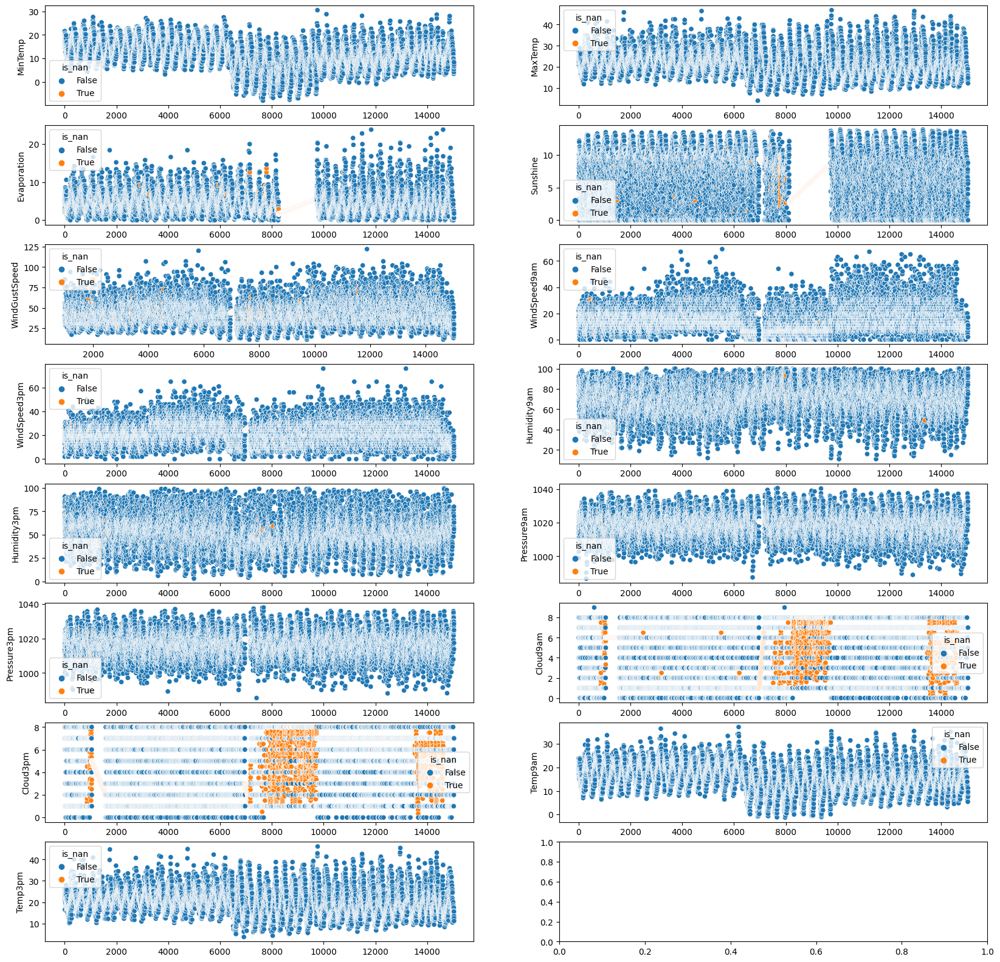

In [45]:
cols = ['MinTemp','MaxTemp','Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm',
       'Temp9am', 'Temp3pm' ]

plot_interpolated_scatter(cols, data, "linear", fsize=(20,20))

### Interpolar utilizando method='nearest'
<p> Al intentar interpolar el resto de las variables utilizando nearest vemos que el resultado no es bueno para Evaporation y Sunshine por la gran cantidad de datos consecutivos faltantes en ambas. </p>
<p> Se nota una mejora en el caso de Cloud9am y Cloud3pm el cual puede ser considerado posteriormente si no se encuentra una forma mas optima de interpolar los valores nulos de estas variables.</p>

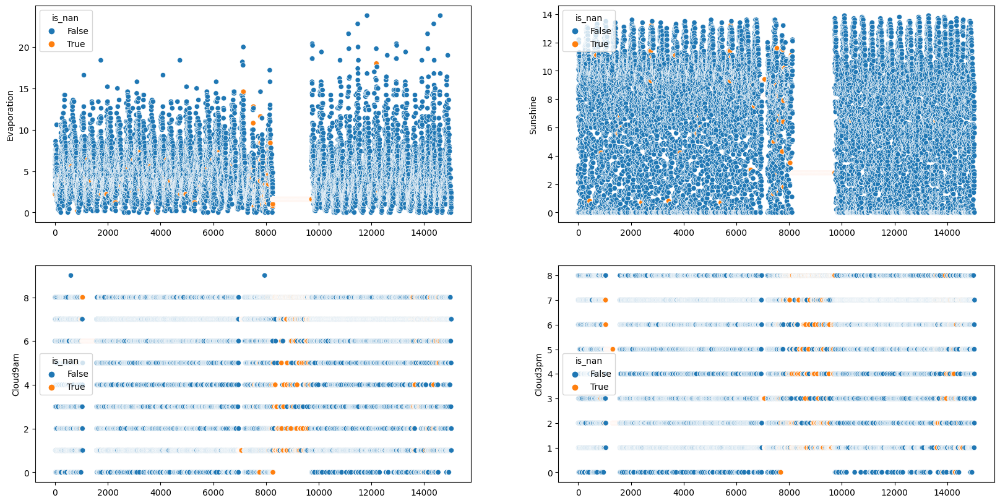

In [46]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]

plot_interpolated_scatter(cols, data, "nearest", fsize=(20,10))

### Interpolar utilizando method='cubicspline'
Intentamos a continuación inteporlar utilizando distintos métodos polinómicos para intentar conseguir un mejor ajuste para la interpolacion, pero para grandes brechas entre datos los modelos polinómicos no se ajustan bien. 
<p> Por lo que interpolacion mediante metodos polinomicos es la peor opción de todas las analizadas hasta ahora, incluso intentando métodos de órden de diferente exponentes.</p>

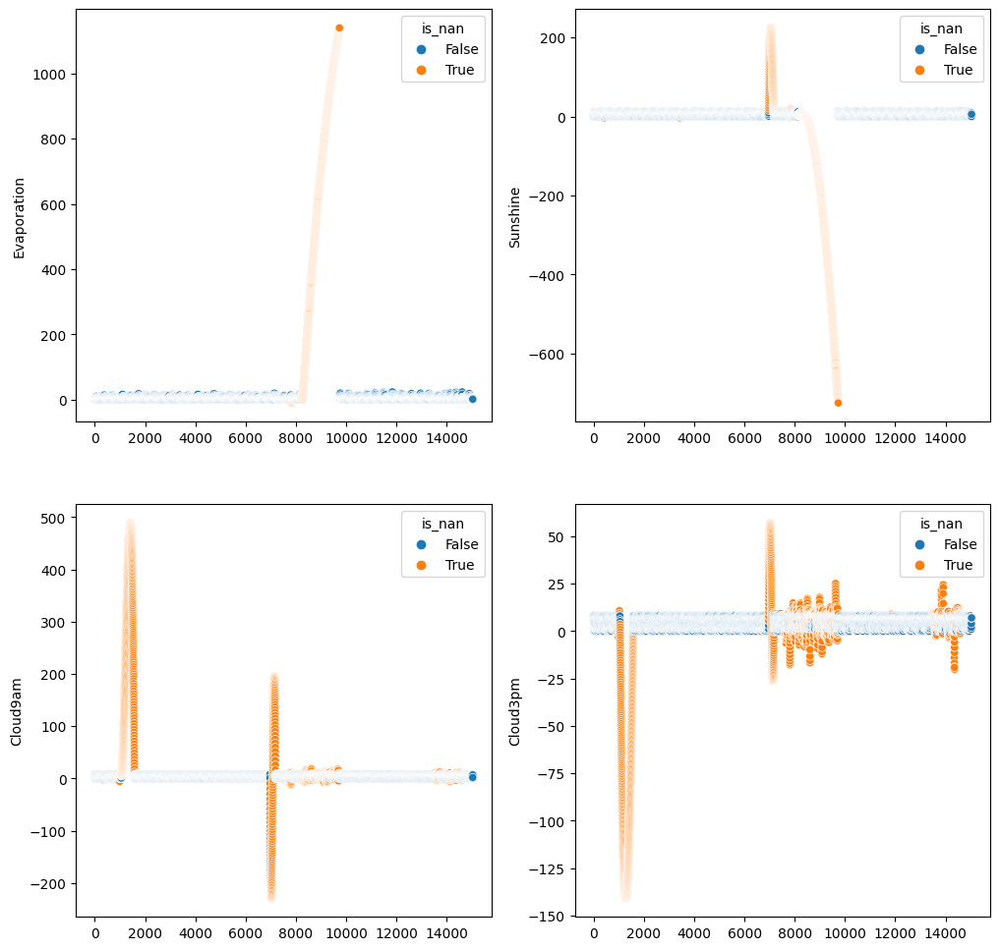

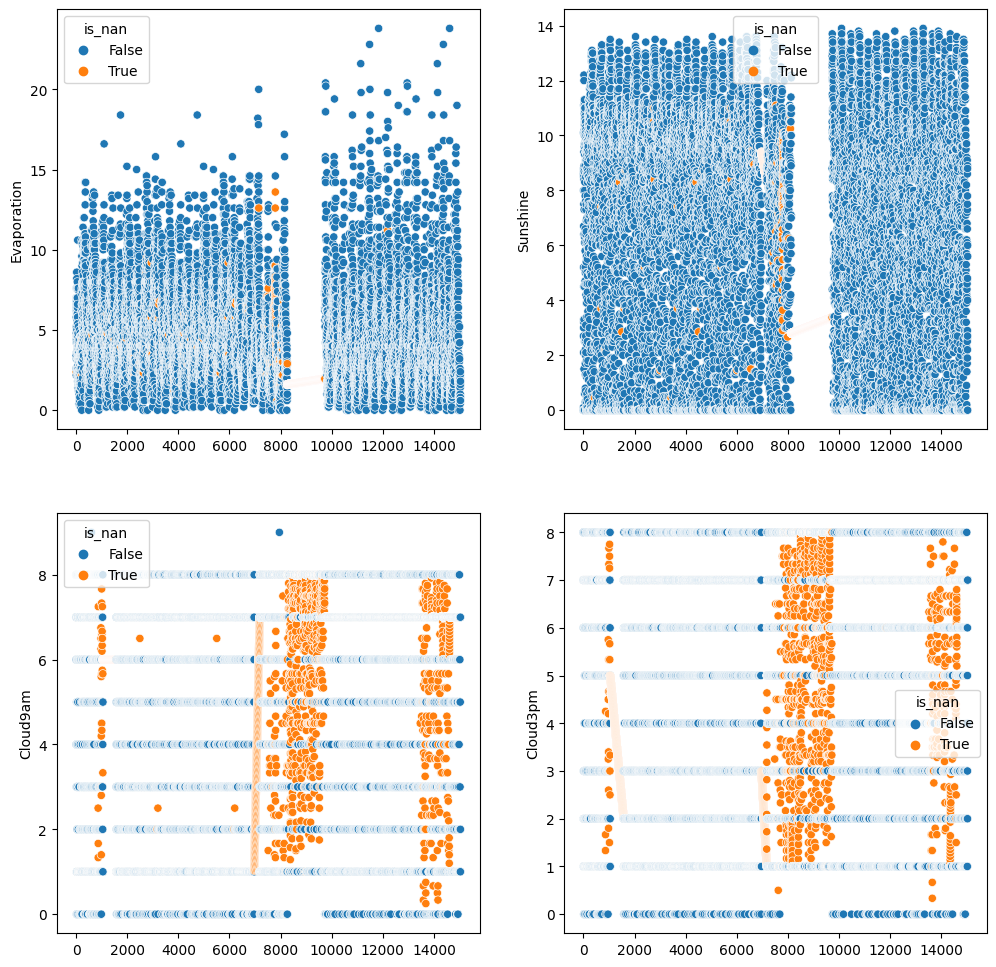

In [47]:
cols = [
    'Evaporation', 'Sunshine',
    'Cloud9am', 'Cloud3pm',
]
plot_interpolated_scatter(cols, data, method="cubicspline")
plot_interpolated_scatter(cols, data, method="polynomial", order=1)

### Conclusión de interpolaciones
Utilizaremos una interpolación lineal para las variables 'MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am' y 'Temp3pm'.

Borraremos las filas nulas para las variables 'Cloud9am' y 'Cloud3pm'.
       
Para Evaporation y Sunshine intentaremos posteriormente encontrar variables explicativas para estas para generar un modelo, e intentar predecir los valores nulos faltantes de la forma mas cercana posible.

In [48]:
linear_cols = ['MinTemp','MaxTemp', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Temp9am', 'Temp3pm']
nearest_cols = ['Cloud9am', 'Cloud3pm']

for col in linear_cols:
    data[col].interpolate(method="linear", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")

for col in nearest_cols:
    data[col].interpolate(method="nearest", inplace=True)
    print( f"{col} valores nulos : {data[col].isnull().sum()}")


MinTemp valores nulos : 0
MaxTemp valores nulos : 0
WindSpeed9am valores nulos : 0
WindSpeed3pm valores nulos : 0
Humidity9am valores nulos : 0
Humidity3pm valores nulos : 0
Pressure9am valores nulos : 0
Pressure3pm valores nulos : 0
Temp9am valores nulos : 0
Temp3pm valores nulos : 0
Cloud9am valores nulos : 0
Cloud3pm valores nulos : 0


### Nota
Vemos que la interpolacion lineal no se completa exitosamente para "WindGustSpeed". Esto se debe a que la ultima row para esta columna está vacia, por lo que no puede crearse una relación entre el último dato registrado y la última row de esta columna.
<p>Graficamos nuevamente un heatmap para entender cómo quedó la distribución de valores nulos en el dataset después de la interpolación</p>

<Axes: >

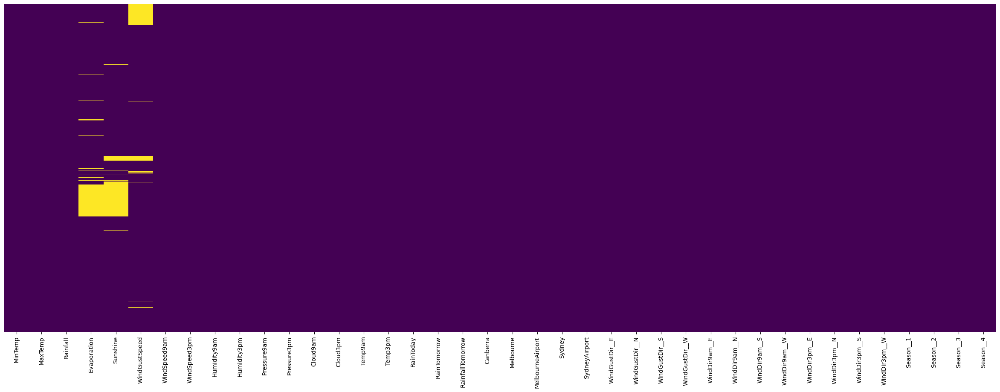

In [49]:
fig, ax = plt.subplots(figsize=(30, 10))
sbn.heatmap(data.isnull(), yticklabels=False, cmap="viridis", cbar=False,)

Normalizaremos los datos y crearemos una matriz de correlación para tratar de entender la importancia y el peso de las mismas.
Se puede asumir que todavia las variables que tienen valores nulos son variables explicativas importantes para el modelo.

Sunshine ( luminocidad ): probablemente muy relacionado a la evaporación, la temperatura, la nubosidad y la presión.
Evaporation ( Evaporacion): se asume que tiene las mismas relaciones fuertes al igual sunshine.
WindGustSpeed( Rafagas de viento ): Probablemente muy relacionada a la presión.

Graficaremos una matriz de correlación para ver si se puede crear un modelo de regresión para predecir la mayor cantidad de valores para estas variables.

## Normalizar variables numéricas
Normalizamos las variables numéricas ya que se encuentran todas en diferentes escalas

In [50]:
from sklearn.preprocessing import StandardScaler

categorical_vars = [ 'RainTomorrow', 'RainToday','Canberra', 'Melbourne', 'MelbourneAirport',
       'Sydney', 'SydneyAirport', 'WindGustDir__E', 'WindGustDir__N',
       'WindGustDir__S', 'WindGustDir__W', 'WindDir3pm__E', 'WindDir3pm__N',
       'WindDir3pm__S', 'WindDir3pm__W', 'WindDir9am__E', 'WindDir9am__N', 'WindDir9am__S', 'WindDir9am__W',
       'Month__1', 'Month__2', 'Month__3',
       'Month__4', 'Month__5', 'Month__6', 'Month__7', 'Month__8', 'Month__9',
       'Month__10', 'Month__11', 'Month__12', 'Season__1', 'Season__2',
       'Season__3', 'Season__4'
]

numerical_vars = [ col for col in data.columns if col not in categorical_vars ]

scale= StandardScaler() 
scaled_data = data.copy()

scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

## Matriz de correlación

<Axes: >

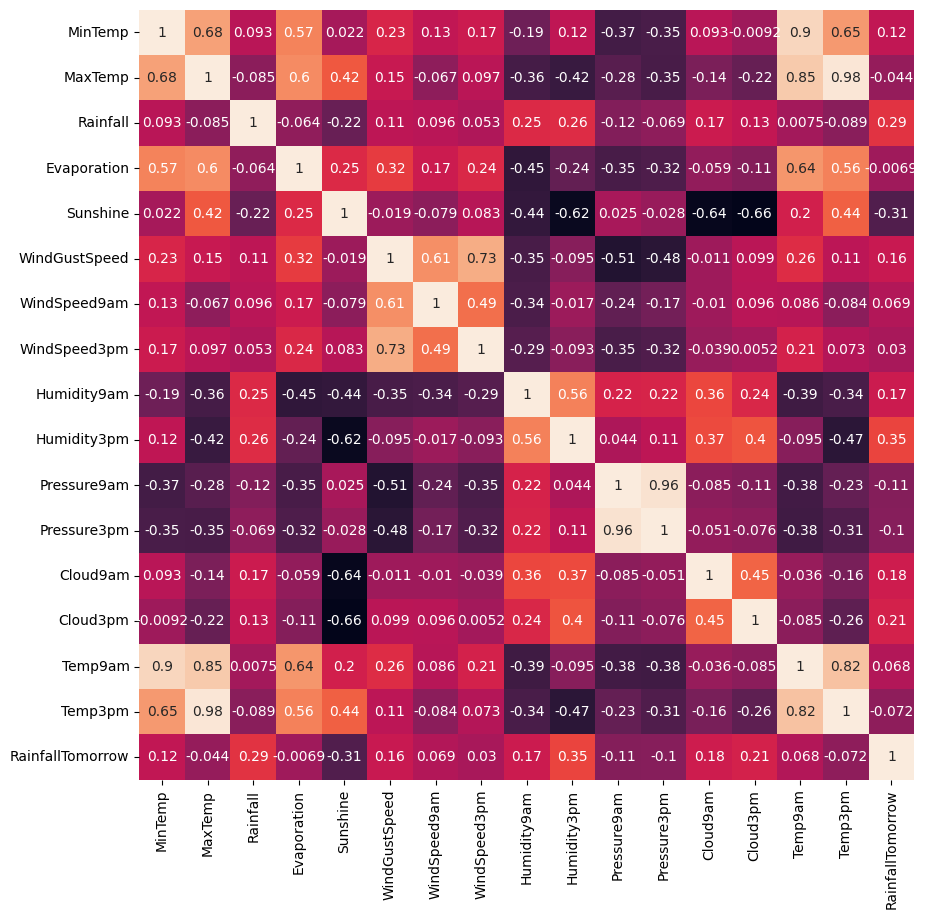

In [51]:
heatmap_data = scaled_data[numerical_vars]

plt.figure(figsize=(10, 10))
sbn.heatmap(heatmap_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

Concluimos que se cumple nuestra predicción anterior acerca de la correlaciones que se encuentran entre las distintas variables.
<p>Por ejemplo que Sunshine tiene una buena correlación con los dias nublados, la humedad y la temperatura.</p>
<p>Se intentera calcular los valores nulos para WindGustSpeed utilizando un modelo de regresion.</p>

<Axes: >

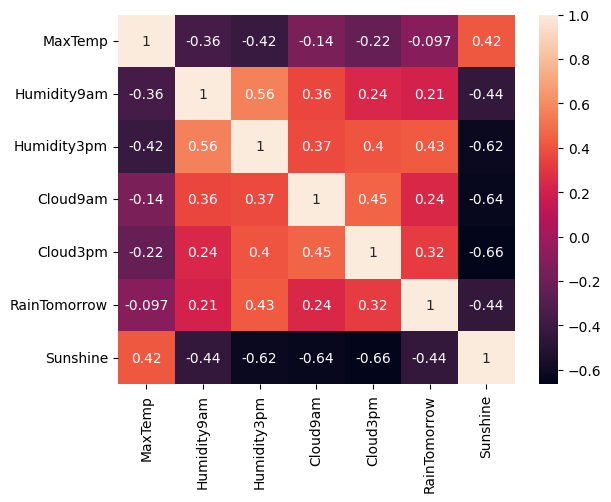

In [52]:
x_train_cols = ["MaxTemp", "Humidity9am", "Humidity3pm", "Cloud9am", "Cloud3pm","RainTomorrow"]

sunshine_data = data[ x_train_cols + ["Sunshine"] ] 
plt.figure()
sbn.heatmap(sunshine_data.corr(numeric_only=True, method='pearson'), yticklabels=True, annot=True)


Vemos que la correlación entre las variables y Sunshine siguen siendo buenas. Por lo que intentaremos predecir los valores nulos utilizando una regresión lineal.

0.6858546463928049 4.586893288778241
-0.7072534451466062 25.77190978410575


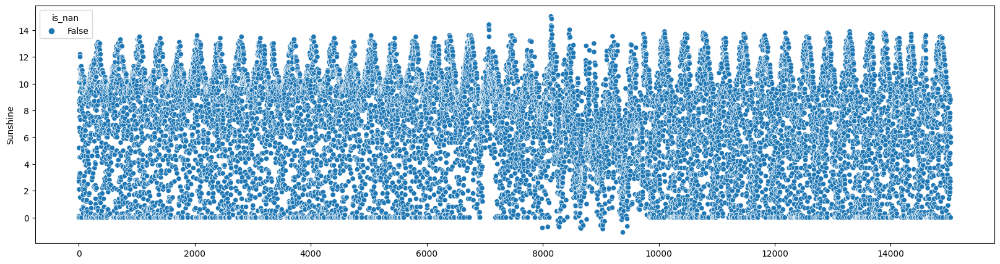

In [53]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.metrics import confusion_matrix, classification_report

sunshine_data_null =  sunshine_data[sunshine_data["Sunshine"].isnull()]
sunshine_data_not_null = sunshine_data[sunshine_data["Sunshine"].notnull()] 

x_pred = sunshine_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(sunshine_data_not_null[x_train_cols], sunshine_data_not_null["Sunshine"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Sunshine"] = y_pred
data["Sunshine"].update(x_pred["Sunshine"])

plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5), sy=1)

### Interpolar Sunshine con regresion lineal
Como podemos ver ahora se ajustan mucho mejor los valores para esta variable. Ahora acotaremos los valores entre 0 y 12 para mejorar los datos.

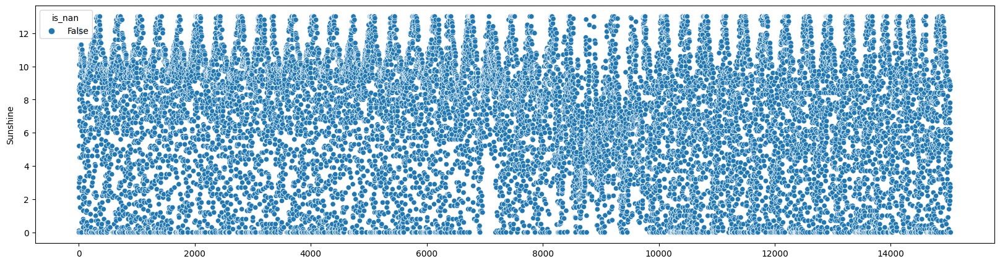

In [54]:
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value >0 else 0 )
data["Sunshine"] = data["Sunshine"].apply(lambda value: value if value <=13 else 13 )
plot_interpolated_scatter(["Sunshine"], data, method="linear",fsize=(20,5),sy=1)

### Regresión e Interpolar Evaporation
Realizamos la creacion de un modelo de regresion lineal para predecir los valores null de Evaporation

0.5946606274241069 3.851946973272954
-0.8768226861280939 16.659869226083583


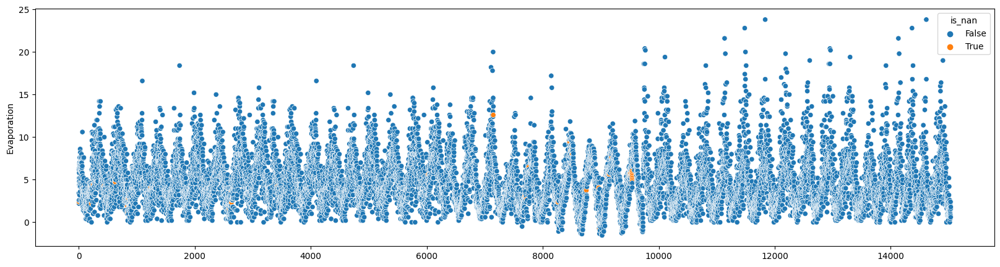

In [55]:
x_train_cols = [ c for c in data.columns if c != "Evaporation" ]

evaporation_data = data[ x_train_cols + ["Evaporation"] ] 
evaporation_data = evaporation_data[ 
    evaporation_data["WindGustSpeed"].notnull()
]

evaporation_data_null =  evaporation_data[evaporation_data["Evaporation"].isnull()]
evaporation_data_not_null = evaporation_data[evaporation_data["Evaporation"].notnull()] 

x_pred =evaporation_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(evaporation_data_not_null[x_train_cols], evaporation_data_not_null["Evaporation"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["Evaporation"] = y_pred
data["Evaporation"].update(x_pred["Evaporation"])
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5), sy=1)

### Interpolamos Evaporation
<p> Se probaron varias formas de generar un modelo que se ajuste lo mejor posible para predecir los valores faltantes para la evaporación.</p>
<p> Se concluye heurísticamente que la mejor aproximacion parece ser utilizando el dataset completo. </p>
<p> Quedan algunos valores nulos que no pudieron ser interpolados y agregados al dataset pero vemos que se ajustan bien aplicando una interpolación lineal con el resto de los datos.</p>
<p> Vemos en el grafico que los datos se interpolan de forma mas prolija que todas las estimaciones anteriores usando lo metodos de interpolacion estandar provisto por la libreia Pandas. </p>
<p> Para los valores menores a 0 se restarán la distancia del minimo valor, para moverlos sobre 0 y simular un comportamiento mas parecido a la realidad </p>

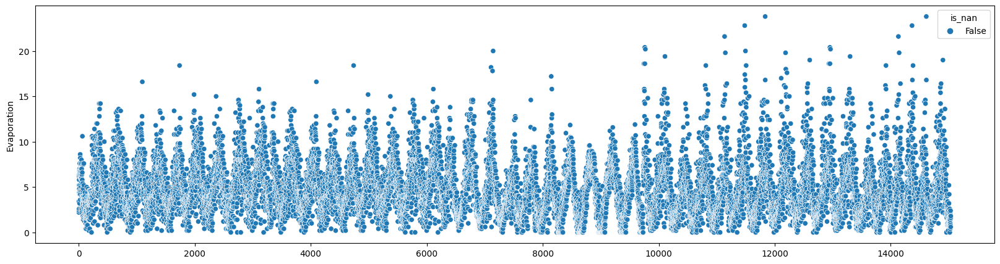

In [56]:
data["Evaporation"].interpolate(method="linear", inplace=True)
data["Evaporation"] = data["Evaporation"].apply(lambda value: 0 if value < 0 else value  )
plot_interpolated_scatter(["Evaporation"], data, method="linear",fsize=(20,5),sy=1)

# Interpolar WindGust
Se replica exactamente el mismo procedimiento que para la estimación de Evaporation y Sunshine.

0.7204600296173302 64.29997062249271
-0.8733671553511881 411.1378544846344


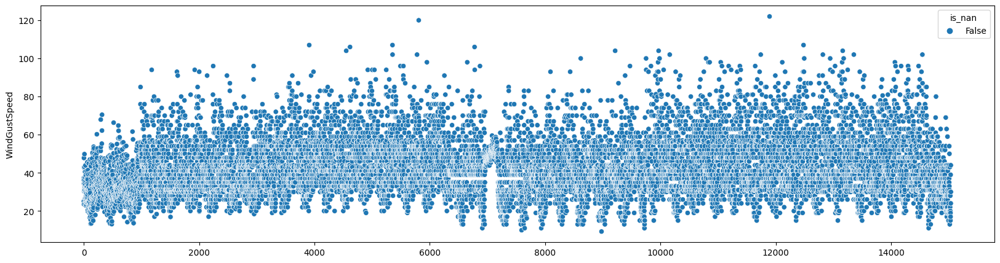

In [57]:
x_train_cols = [ c for c in data.columns if c != "WindGustSpeed" ]

windgust_data = data.copy()

windgust_data_null =  windgust_data[windgust_data["WindGustSpeed"].isnull()]
windgust_data_not_null = windgust_data[windgust_data["WindGustSpeed"].notnull()] 

x_pred = windgust_data_null[x_train_cols]
x_train, x_test, y_train, y_test = train_test_split(windgust_data_not_null[x_train_cols], windgust_data_not_null["WindGustSpeed"], test_size=0.2)

lr = LinearRegression()

lr.fit(x_train,y_train)

y_pred = lr.predict(x_test)

print( 
    r2_score(y_test, y_pred),
    mean_squared_error( y_test, y_pred)
)

y_pred = lr.predict(x_pred)
y_pred_len = len(y_pred)
print( 
    r2_score(y_train[:y_pred_len], y_pred),
    mean_squared_error( y_train[:y_pred_len], y_pred)
)

x_pred["WindGustSpeed"] = y_pred
data["WindGustSpeed"].update(x_pred["WindGustSpeed"])
plot_interpolated_scatter(["WindGustSpeed"], data, method="polynomial",fsize=(20,5), sy=1, order=1)

# Escalar nuevamente los datos del dataset para toda las variables numéricas
Volvemos a escalar con nuestros datos nulos ya completos.

In [58]:
scaled_data = data.copy()
scaled_data[numerical_vars] = scale.fit_transform(data[numerical_vars])

### Graficar la matriz de correlación final escalada sin valores nulos

<Axes: >

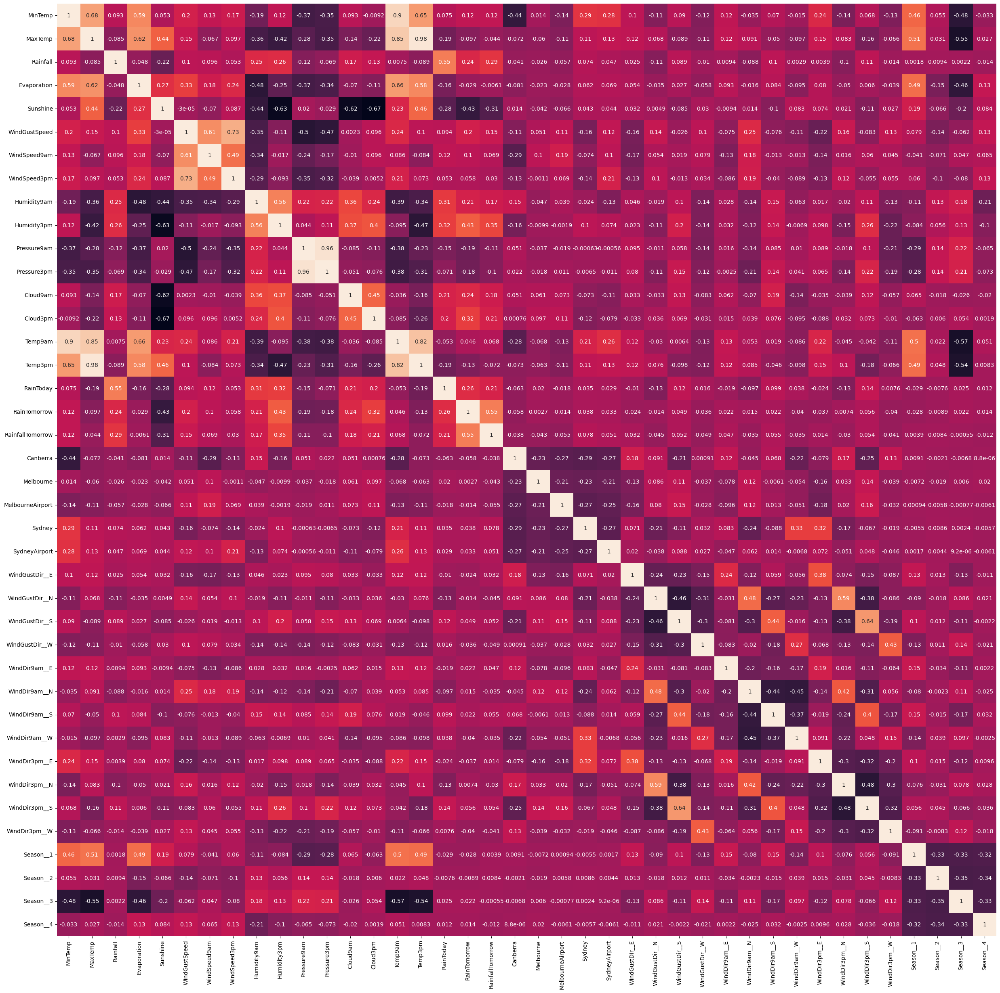

In [59]:
plt.figure(figsize=(30, 30))
sbn.heatmap(scaled_data.corr(numeric_only=True, method='pearson'), yticklabels=True, cbar=False, annot=True)

### Regresión Lineal Simple

In [60]:
x = scaled_data.copy()
y = x["RainfallTomorrow"].copy()
x.drop("RainfallTomorrow", axis=1, inplace=True)
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(x_train, y_train)
y_pred = model.predict(x_test)


r2 = r2_score( y_test, y_pred)
m_e2 = mean_squared_error( y_test, y_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 


score R2: 0.3512
error MSE: 0.6998


# Regresión Lineal sin tratamientos de los datos
Aplicaremos una regresión lineal borrando todos los datos despues de realizar el encoding de las variables y sin interpolar ningun dato.

In [61]:
full_data_encoded.dropna(inplace=True)
full_data_encoded[numerical_vars] = scale.fit_transform(full_data_encoded[numerical_vars])

fx = full_data_encoded.copy()
fy = fx["RainfallTomorrow"].copy()
fx.drop("RainfallTomorrow", axis=1, inplace=True)
fx_train, fx_test, fy_train, fy_test = train_test_split(fx, fy, test_size=0.3, random_state=42)

model = LinearRegression()
model.fit(fx_train, fy_train)
fy_pred = model.predict(fx_test)

r2 = r2_score( fy_test, fy_pred)
m_e2 = mean_squared_error( fy_test, fy_pred)
print (f"score R2: {round(r2, 4)}")
print (f"error MSE: {round(m_e2, 4)}") 

score R2: 0.4012
error MSE: 0.4243


## Conclusión Regresion Lineal
<p>Se puede ver que a pesar del esfuerzo al completar y normalizar los datos, el modelo lineal no se ajusta bien para la predicción de RainfallTomorrow con un score de 0.35. </p>
<p>Tiene mejor score y un error mas bajo al realizar un drop directamente sobre los datos nulos, por lo que seguiremos usando este set de datos en vez del interpolado.</p>

# Regularización y Regresiones Lasso, Ridge y ElasticNet 

In [62]:
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, RidgeCV, ElasticNetCV, LassoCV

lr = LinearRegression()
lr.fit(fx, fy)

print("Coeficientes del modelo de regresión lineal:")
#print(lr.coef_)
print(lr.score(fx,fy))

for alpha, ratio in [(0.9,0.2), (0.6,0.5), (0.3,0.5), (0.2,0.5), (0.1,0.3),
                     (0.01,0.9), (0.001,0.7), (0.0001,0.2), (0.00001,0.5), (0.000001,0.9)]:
    lasso = Lasso(alpha=0.1)
    ridge = Ridge(alpha=0.1) 
    elasticnet = ElasticNet(alpha=alpha, l1_ratio=ratio)

    lasso.fit(fx, fy)
    ridge.fit(fx, fy)
    elasticnet.fit(fx,fy)


    print(f"\nAlpha: {alpha} Ratio {ratio}")
    #print(lasso.coef_)
    print(f"Lasso Coef: {round(lasso.score(fx,fy), 4)}")

    #print(ridge.coef_)
    print(f"Ridge Coef: {round(ridge.score(fx,fy), 4)}")

    #print(elasticnet.coef_)
    print(f"ElasticNet : {round(elasticnet.score(fx,fy), 4)}")

Coeficientes del modelo de regresión lineal:
0.3461322188219069

Alpha: 0.9 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0815

Alpha: 0.6 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.0163

Alpha: 0.3 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.149

Alpha: 0.2 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2211

Alpha: 0.1 Ratio 0.3
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.2973

Alpha: 0.01 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3383

Alpha: 0.001 Ratio 0.7
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3459


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.440e+00, tolerance: 1.067e+00
  model = cd_fast.enet_coordinate_descent(



Alpha: 0.0001 Ratio 0.2
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-05 Ratio 0.5
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461

Alpha: 1e-06 Ratio 0.9
Lasso Coef: 0.2633
Ridge Coef: 0.3461
ElasticNet : 0.3461


/home/simon/.local/lib/python3.10/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.036e+03, tolerance: 1.067e+00
  model = cd_fast.enet_coordinate_descent(


# Regularizacion y Regresiones Lasso, Ridge y ElasticNet Cross Validation 

In [63]:
lassoCV = LassoCV() 
ridgeCV = RidgeCV() 
elasticnetCV = ElasticNetCV()

lassoCV.fit(fx, fy)
ridgeCV.fit(fx, fy)
elasticnetCV.fit(fx,fy)

print("lasso alpha:",lassoCV.alpha_)
print("ridge alpha:",ridgeCV.alpha_)
print("elastic net alpha:",elasticnetCV.alpha_ )

# Mostrar coeficientes
print("\nCoeficientes del modelo Lasso:")
#print(lassoCV.coef_)
print(round(lassoCV.score(fx,fy), 4))

print("\nCoeficientes del modelo Ridge:")
#print(ridgeCV.coef_)
print(round(ridgeCV.score(fx,fy), 4))


print("\nCoeficientes del modelo ElasticNet:")
#print(elasticnetCV.coef_)
print(round(elasticnetCV.score(fx,fy), 4))

lasso alpha: 0.0011696690144337191
ridge alpha: 10.0
elastic net alpha: 0.0007144000326480332

Coeficientes del modelo Lasso:
0.3456

Coeficientes del modelo Ridge:
0.3461

Coeficientes del modelo ElasticNet:
0.346
